In [1]:
import numpy as np
import matplotlib.pyplot as plt
import desc.io
from desc.grid import LinearGrid, ConcentricGrid
from desc.objectives import (
    ObjectiveFunction,
    FixBoundaryR,
    FixBoundaryZ,
    FixModeR,
    FixModeZ,
    FixPressure,
    FixCurrent,
    FixIota,
    FixPsi,
    AspectRatio,
    ForceBalance,
    QuasisymmetryTwoTerm,
    RotationalTransform
)
from desc.optimize import Optimizer
from desc.plotting import (
    plot_grid,
    plot_boozer_modes,
    plot_boozer_surface,
    plot_qs_error,
    plot_boundaries,
    plot_boundary,
    plot_3d
)

from desc.equilibrium import Equilibrium
from desc.geometry import FourierRZToroidalSurface
from desc.profiles import PowerSeriesProfile

DESC version 0+untagged.9470.gaf75d5a.dirty,using JAX backend, jax version=0.4.38, jaxlib version=0.4.38, dtype=float64
Using device: CPU, with 5.30 GB available memory


In [2]:
eq_fam = desc.io.load("inputs/nfp2_QA.h5")
eq_init = eq_fam[-1]
eq_qs = eq_init.copy()

grid_vol = LinearGrid(
    M=eq_qs.M_grid,
    N=eq_qs.N_grid,
    NFP=eq_qs.NFP,
    rho=np.arange(0.1,1.1,0.1),
    sym=eq_qs.sym
)

In [3]:
eq_qs = eq_init.copy()
optimizer = Optimizer("lsq-exact")

for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    maxModeInt = maxMode

    #Attempt to fix interior
    fixed_R_modes_int = eq_qs.R_basis.modes[np.max(np.abs(eq_qs.R_basis.modes), 1) > maxModeInt, :]
    fixed_Z_modes_int = eq_qs.Z_basis.modes[np.max(np.abs(eq_qs.Z_basis.modes), 1) > maxModeInt, :]

    
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=10, weight=100),
        ForceBalance(eq=eq_qs, weight=1),
    ))
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixModeR(eq=eq_qs, modes=fixed_R_modes_int),
        FixModeZ(eq=eq_qs, modes=fixed_Z_modes_int),
        FixPressure(eq=eq_qs),
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        verbose=2,
        maxiter=500,
        options={}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 672 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 707 ms
Timer: Objective build = 3.73 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fix mode R
Building objective: fix mode Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 2.13 sec
Timer: Linear constraint projection build = 3.71 sec
Number of parameters: 110
Number of objectives: 1051
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1          1.250e+05                                    3.125e+05 

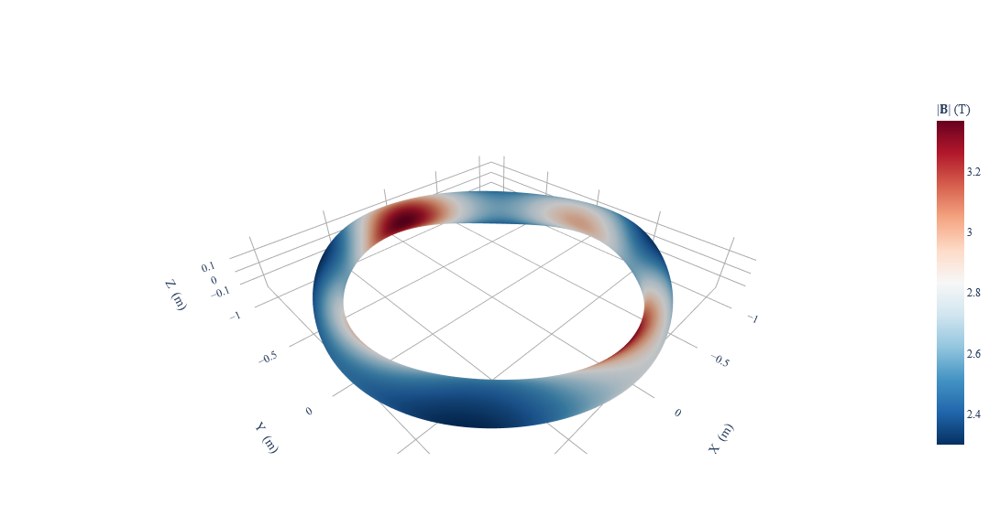

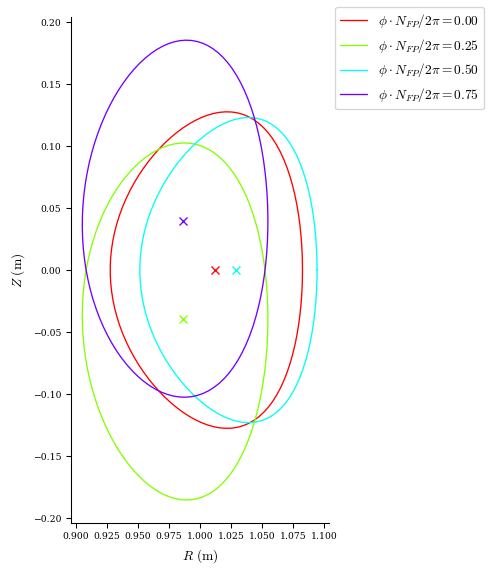

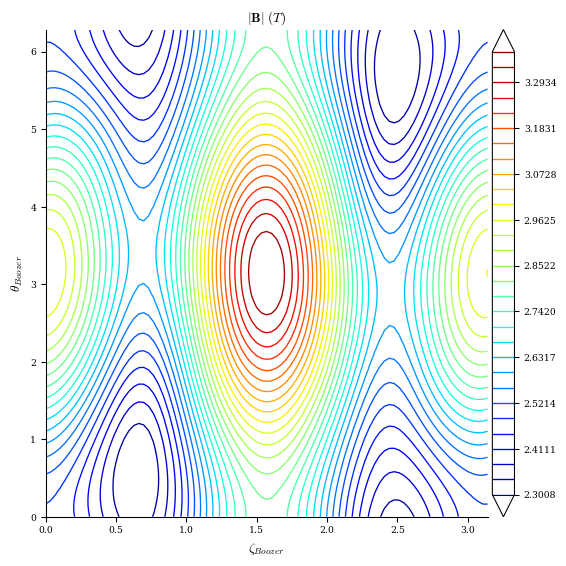

In [4]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))

In [5]:
for maxMode in range(2,3):
    fixed_R_modes = np.vstack(([0,0,0], eq_qs.surface.R_basis.modes[np.max(np.abs(eq_qs.surface.R_basis.modes), 1) > maxMode, :]))
    
    fixed_Z_modes = eq_qs.surface.Z_basis.modes[np.max(np.abs(eq_qs.surface.Z_basis.modes), 1) > maxMode, :]
    maxModeInt = maxMode

    #Attempt to fix interior
    fixed_R_modes_int = eq_qs.R_basis.modes[np.max(np.abs(eq_qs.R_basis.modes), 1) > maxModeInt, :]
    fixed_Z_modes_int = eq_qs.Z_basis.modes[np.max(np.abs(eq_qs.Z_basis.modes), 1) > maxModeInt, :]

    
    constWeight = 10
    
    objective_f = ObjectiveFunction((
        AspectRatio(eq=eq_qs, target=6, weight=1),
        ForceBalance(eq=eq_qs, weight=10),
        QuasisymmetryTwoTerm(eq=eq_qs, grid=grid_vol, weight=1)
    ))
    
    constraints = (
        FixBoundaryR(eq=eq_qs, modes=fixed_R_modes),
        FixBoundaryZ(eq=eq_qs, modes=fixed_Z_modes),
        FixModeR(eq=eq_qs, modes=fixed_R_modes_int),
        FixModeZ(eq=eq_qs, modes=fixed_Z_modes_int),
        FixPressure(eq=eq_qs),
        FixPsi(eq=eq_qs),
        FixCurrent(eq=eq_qs),
    )    
    eq_qs, result = eq_qs.optimize(
        objective=objective_f,
        constraints=constraints,
        optimizer=optimizer,
        copy=True,
        verbose=2,
        maxiter=500,
        options={}
    )

Building objective: aspect ratio
Precomputing transforms
Timer: Precomputing transforms = 36.9 ms
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 79.1 ms
Building objective: QS two-term
Precomputing transforms
Timer: Precomputing transforms = 721 ms
Timer: Objective build = 1.33 sec
Building objective: lcfs R
Building objective: lcfs Z
Building objective: fix mode R
Building objective: fix mode Z
Building objective: fixed pressure
Building objective: fixed Psi
Building objective: fixed current
Building objective: self_consistency R
Building objective: self_consistency Z
Building objective: lambda gauge
Building objective: axis R self consistency
Building objective: axis Z self consistency
Timer: Objective build = 1.20 sec
Timer: Linear constraint projection build = 2.81 sec
Number of parameters: 110
Number of objectives: 2941
Starting optimization
Using method: lsq-exact
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Opti

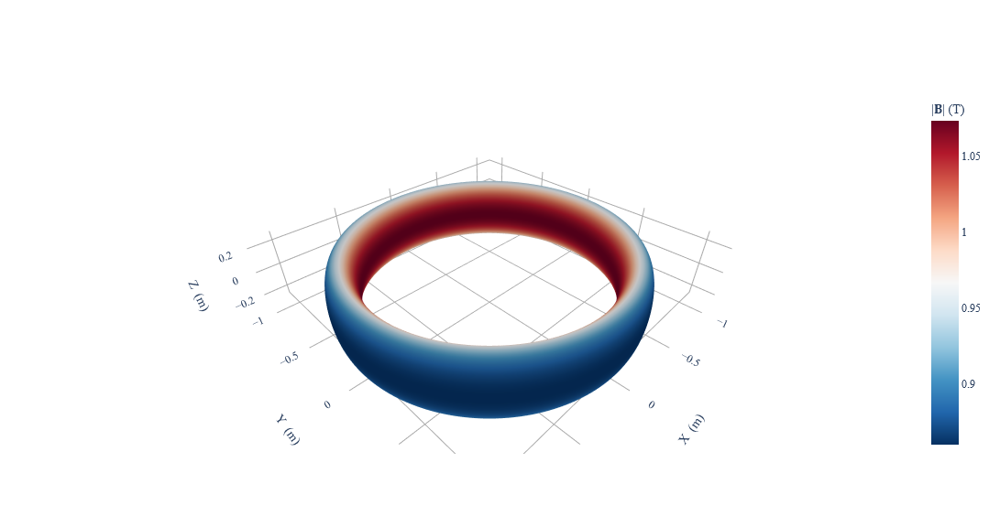

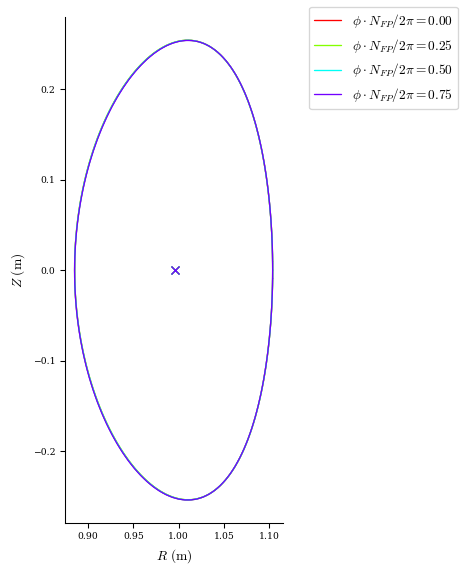

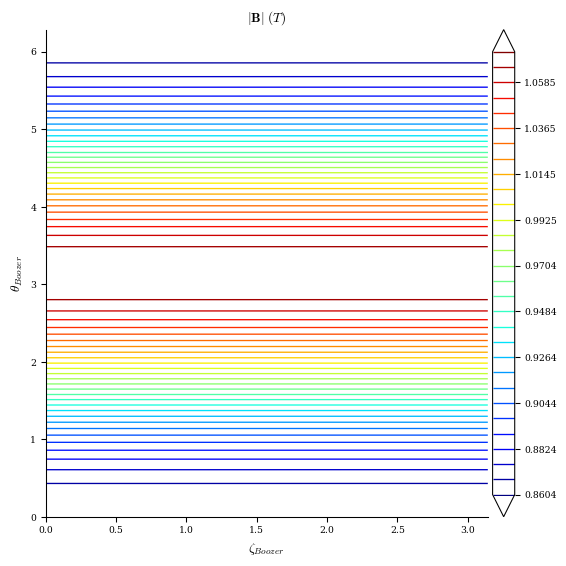

In [6]:
plot_boundary(eq_qs, figsize=(6,6))
plot_boozer_surface(eq_qs, figsize=(6,6))
plot_3d(eq_qs, "|B|", figsize=(6,6))
